## Objetivo: criar um script para treino do modelo via checkpoint.

In [1]:
import tensorflow as tf

import os
import PIL
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

2021-08-04 19:18:46.637379: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-08-04 19:18:46.637428: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


1. Ler e interpretar o guide do TensorFlow

2. Carregar o modelo (completo) já treinado, salvar os pesos em algum lugar e carregá-los.

In [3]:
modelo_carregado = tf.keras.models.load_model("modelo_teste_keras.h5")
modelo_carregado.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d (Conv2D)              (None, None, None, 64)    1664      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 32)    18464     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 9)     2601      
_________________________________________________________________
tf.nn.depth_to_space (TFOpLa (None, None, None, 1)     0         
Total params: 59,657
Trainable params: 59,657
Non-trainable params: 0
_________________________________________________________

3. Salvar os pesos

In [4]:
modelo_carregado.save_weights("./meu-checkpoint")

4. Carregar os pesos em um novo modelo

In [6]:
def constroi_modelo(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)
    
    model = keras.Model(inputs, outputs)
    
    loss_fn = keras.losses.MeanSquaredError()
    optimizer = keras.optimizers.Adam(learning_rate=0.001)
    model.compile(
        optimizer=optimizer, loss=loss_fn,
    )

    return model

In [7]:
modelo_zerado = constroi_modelo(3, 1)

In [8]:
modelo_zerado.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d (Conv2D)              (None, None, None, 64)    1664      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 32)    18464     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 9)     2601      
_________________________________________________________________
tf.nn.depth_to_space_1 (TFOp (None, None, None, 1)     0         
Total params: 59,657
Trainable params: 59,657
Non-trainable params: 0
_________________________________________________________

In [9]:
modelo_zerado.load_weights("./meu-checkpoint")

5. Fazer o teste com uma imagem com o modelo carregado x modelo zerado

In [13]:
def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

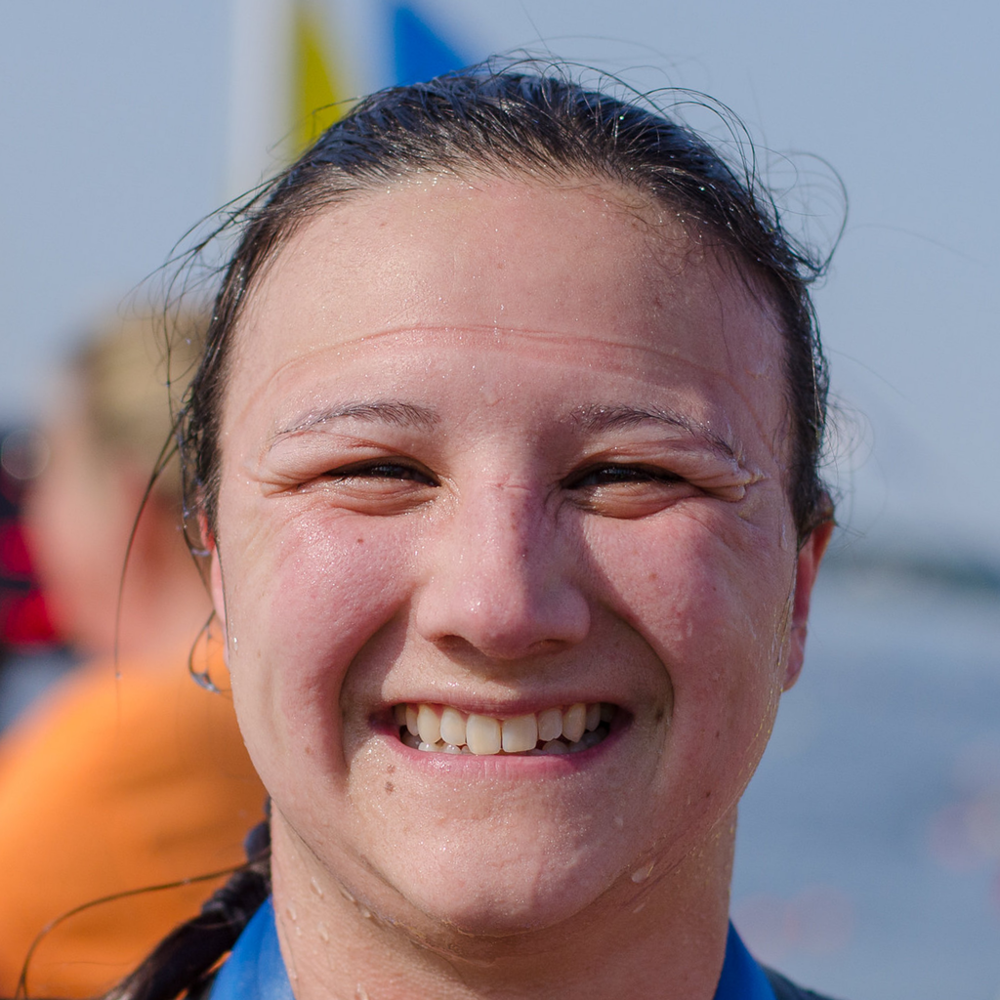

In [12]:
img_mulher = PIL.Image.open("img_para_teste.png")
display(img_mulher)

2021-08-04 19:35:47.105092: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2021-08-04 19:35:47.132101: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 1999965000 Hz


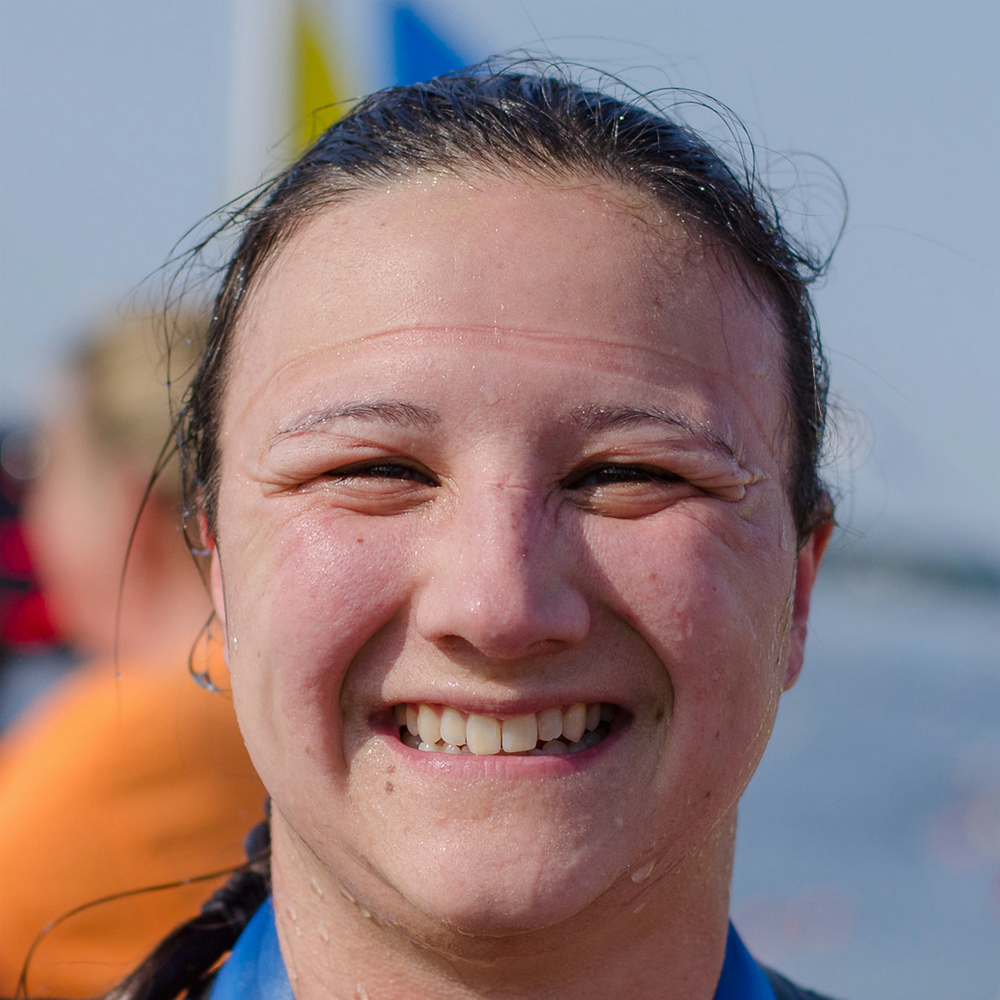

In [14]:
# Upscale com o modelo carregado (salvo por completo)
display(upscale_image(modelo_carregado, img_mulher))

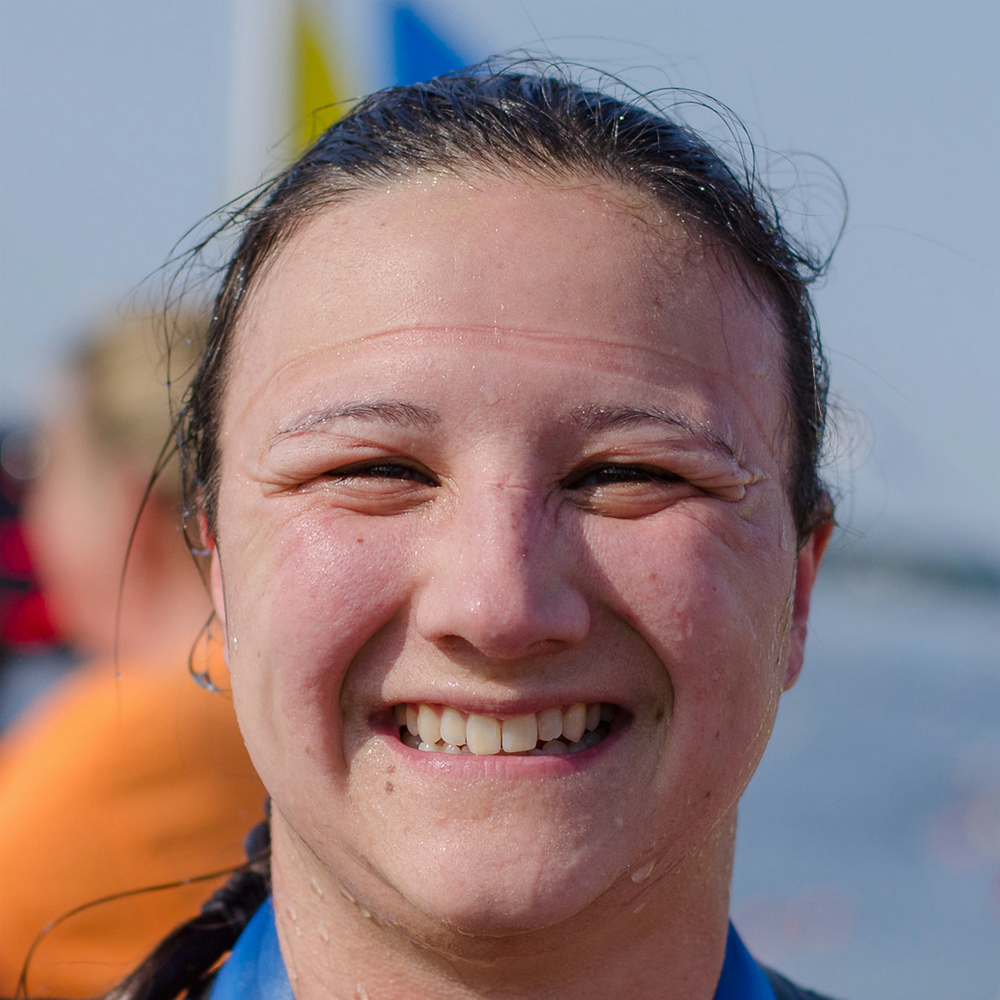

In [16]:
# Upscale com o modelo carregado do zero
img_mulher_fator_3 = upscale_image(modelo_zerado, img_mulher)
display(upscale_image(modelo_zerado, img_mulher))

In [17]:
print(f"Imagem original: {img_mulher.size[0]}x{img_mulher.size[1]}")
print(f"Imagem resultante com fator 3: {img_mulher_fator_3.size[0]}x{img_mulher_fator_3.size[1]}")

Imagem original: 1024x1024
Imagem resultante com fator 3: 3072x3072


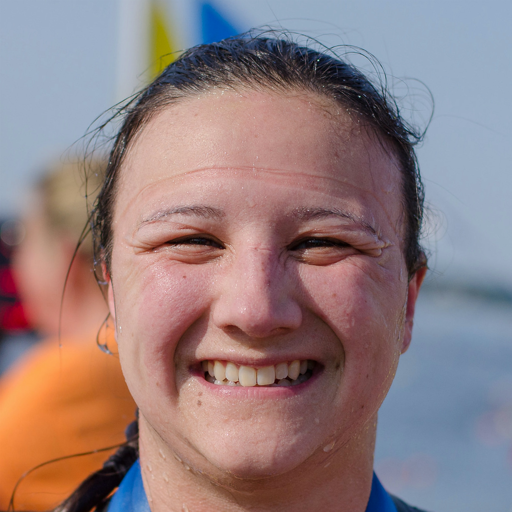

In [22]:
display(upscale_image(modelo_carregado, img_mulher).resize((512, 512), PIL.Image.BICUBIC))

In [20]:
# Upscale com modelo zerado e fator 6
modelo_fator_6 = constroi_modelo(upscale_factor=2, channels=1)
modelo_fator_6.load_weights("./meu-checkpoint")

img_mulher_fator_6 = upscale_image(modelo_fator_6, img_mulher)
display(img_mulher_fator_6)

ValueError: Shapes (4,) and (9,) are incompatible